In [16]:

import tensorflow_datasets as tfds
from prismatic import load # ?important for tfds to not cost GPU memory
from sklearn.linear_model import RANSACRegressor
import cv2
import matplotlib
import mediapy
from IPython import display
from PIL import Image
from matplotlib import pyplot as plt

from transformers import pipeline
from PIL import Image
import tqdm

In [3]:
local_path="/home/lixiang/codebase/embodied-CoT/datasets/libero_new/libero_spatial/1.0.0"
builder = tfds.builder_from_directory(builder_dir=local_path)
ds = builder.as_dataset(split=f'train[{0}%:{100}%]')


In [137]:
for i, episode in enumerate(ds):
    episode_id = episode["episode_metadata"]["episode_id"].numpy()
    filename = episode["episode_metadata"]["file_path"].numpy().decode()
    #print(f'{i}: {episode_id}')
    if episode_id == 0:
        break
print(episode_id, filename)

0 /iris/u/moojink/prismatic-dev/LIBERO/libero/datasets/regenerated--no_noops/libero_spatial/pick_up_the_black_bowl_next_to_the_cookie_box_and_place_it_on_the_plate_demo.hdf5


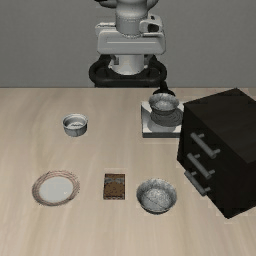

In [138]:
images = [step["observation"]['image'] for step in episode["steps"]]
images_1 = [Image.fromarray(image.numpy()) for image in images]
def as_gif(images, path=f'success_{episode_id}.gif'):
  # Render the images as the gif:
  images[0].save(path, save_all=True, append_images=images[1:], duration=100, loop=0)
  gif_bytes = open(path,'rb').read()
  return gif_bytes
display.Image(as_gif(images_1))

# images_2 = [img.numpy() for img in images]
# mediapy.show_video(images_2, fps=10)

### use depth anything to generate depth information

In [139]:
pipe = pipeline(task="depth-estimation", model="depth-anything/Depth-Anything-V2-Large-hf", device='cuda:0')

In [140]:
images = [step["observation"]['image'] for step in episode["steps"]]
images = [Image.fromarray(image.numpy()) for image in images]
states = [step['observation']['state'] for step in episode['steps']]
actions = [step['action'] for step in episode['steps']]
print(len(images))


110


In [78]:
from tqdm.notebook import tqdm  # 导入适用于 Jupyter Notebook 的 tqdm
depth_list = []
for i, image in tqdm(enumerate(images)):    
    depth = pipe(image)["depth"]
    depth_list.append(depth)

0it [00:00, ?it/s]

You seem to be using the pipelines sequentially on GPU. In order to maximize efficiency please use a dataset


In [121]:
np.array(depth_list[0]).shape

(256, 256)

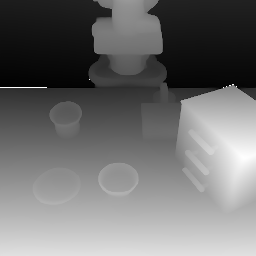

In [79]:
display.Image(as_gif(images=depth_list, path=f'depth_{episode_id}.gif'))

In [141]:
output_dir = '/home/lixiang/codebase/embodied-CoT/scripts/generate_trajectory/trajectory_depth/libero_spatial'
img_list = []
with Image.open(f'/home/lixiang/codebase/embodied-CoT/scripts/generate_trajectory/trajectory_depth/libero_spatial/depth_{episode_id}.gif') as im:
    # 获取 GIF 的总帧数
    frame_count = im.n_frames
    print(frame_count)
    # 遍历每一帧
    frames = []
    try:
        while True:
            # 将当前帧转换为RGB模式（如果需要的话），以确保一致性
            frame = im.convert('L')
            # 将PIL图像转换为numpy数组
            frame_np = np.array(frame)
            frames.append(frame_np)
            # 移动到下一帧
            im.seek(im.tell() + 1)
    except EOFError:
        # 当没有更多帧时，EOFError会被抛出
        pass

print(len(frames))
print(frames[0].shape)

110
110
(256, 256)


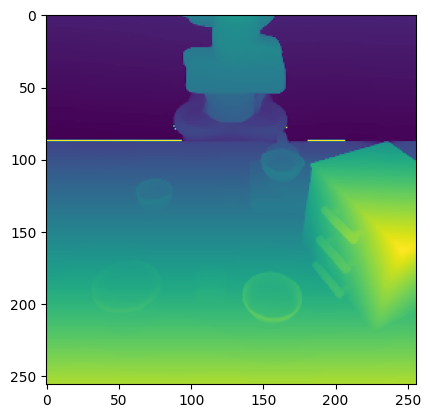

In [143]:
plt.imshow(frames[0])

In [144]:
import os
import json
import numpy as np

suit = 'libero_spatial'
results_path = '/home/lixiang/codebase/embodied-CoT/scripts/generate_trajectory/trajectory_data'
results_json_path = os.path.join(results_path, f"full_trajectory_v3_{suit}.json")

with open(results_json_path, "r") as f:
    trajs = json.load(f)


In [145]:
traj = trajs[filename][f'{episode_id}']
traj_points = traj['trajectory_points']
print(traj_points)

[[128.0, 45.0], [128.24996948242188, 45.18239974975586], [128.19522094726562, 45.36609649658203], [128.16204833984375, 45.98651885986328], [127.97685241699219, 46.66557312011719], [128.1712646484375, 47.89155197143555], [128.15957641601562, 49.15292739868164], [127.96273040771484, 51.1288948059082], [127.4864273071289, 53.393577575683594], [127.43049621582031, 55.46493148803711], [127.58812713623047, 57.78575134277344], [127.44349670410156, 61.26847839355469], [127.32383728027344, 65.1421127319336], [127.11914825439453, 68.9322280883789], [127.34436798095703, 73.155029296875], [126.98753356933594, 77.30530548095703], [126.75755310058594, 81.6952896118164], [127.10409545898438, 86.08377838134766], [127.35797882080078, 90.854248046875], [127.13768768310547, 96.07556915283203], [126.89373016357422, 100.93380737304688], [126.75305938720703, 105.51114654541016], [126.86129760742188, 110.79573059082031], [126.76688385009766, 115.89506530761719], [126.42156219482422, 120.2715835571289], [126.

In [146]:
depth_list = frames
states = np.array(states)
gripper_norm_states = norm(states[:,-1]) #noralize to [0,1]
print(gripper_norm_states.shape)
traj_depth_points = []
for i in range(len(traj_points)):
    point = traj_points[i]
    depth_img = np.array(depth_list[i])
    point_depth = depth_img[int(point[0]), int(point[1])]
    point.append(point_depth)
    point.append(gripper_norm_states[i])
    traj_depth_points.append(point)
print(len(traj_depth_points))

(110,)
110


### fit the discrete depth with RANSAC

In [147]:
traj_depth_points_numpy = np.array(traj_depth_points)
print(traj_depth_points_numpy.shape)
print(traj_depth_points_numpy[0])


(110, 4)
[1.28000000e+02 4.50000000e+01 9.30000000e+01 3.20874006e-02]


In [148]:
points_2d = np.array(traj_depth_points_numpy[:,:3], dtype=np.float32)
points_3d = np.array(states[:,:3], dtype=np.float32)


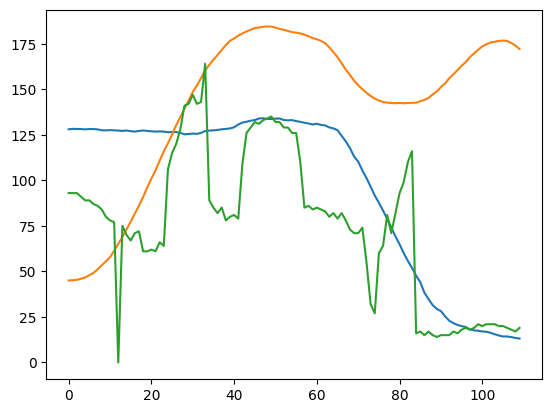

In [151]:
plt.plot(points_2d)

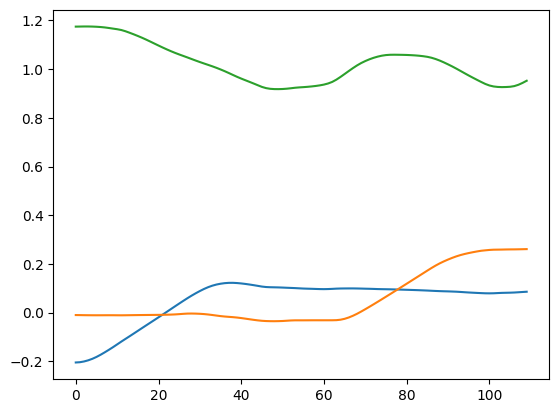

In [150]:
plt.plot(points_3d)

In [152]:
from sklearn.linear_model import RANSACRegressor
points_3d_pr = np.concatenate([points_3d, np.ones_like(points_3d[:, :1])], axis=-1)
points_2d_pr = np.concatenate([points_2d, np.ones_like(points_2d[:, :1])], axis=-1)
reg = RANSACRegressor(random_state=0).fit(points_3d_pr, points_2d_pr)
pr_pos = reg.predict(points_3d_pr)[:, :-1].astype(int)
print(pr_pos.shape)

(110, 3)


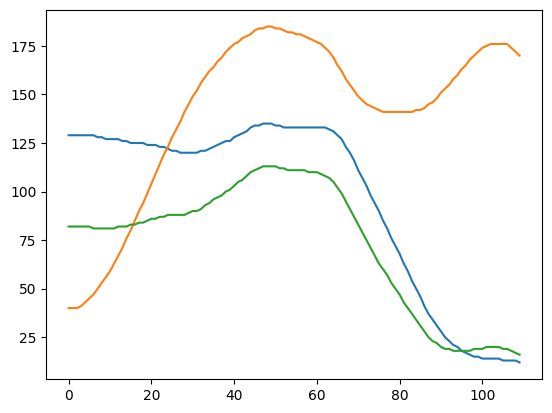

In [153]:
plt.plot(pr_pos)

In [154]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image


def draw_traj(img, traj):
    #print('generated_txt: ', generated_txt)

    x = traj[:,0] # 轨迹的 x 坐标
    y = traj[:,1]                # 轨迹的 y 坐标
    depth = traj[:,2]  # 每个点的深度值 (随机生成)

    # 获取颜色映射
    cmap = plt.get_cmap('plasma')  # 可以选择其他的颜色映射，例如 'plasma', 'inferno', 'magma', 'cividis'  'viridis'等

    for i in range(traj.shape[0]):
        # 计算当前点的颜色
        color = cmap(depth[i] / 255)  # 归一化到 [0, 1] 范围
        color = tuple(int(c * 255) for c in color[:3])  # 将颜色转换为 BGR 格式，并缩放到 [0, 255]
        cv2.circle(img, (int(x[i]), int(y[i])), radius=2, color=color, thickness=-1)
    return img


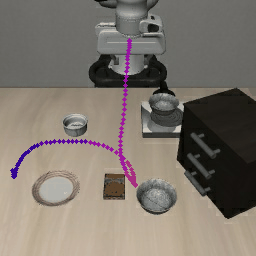

In [155]:
images = [step["observation"]["image"] for step in episode["steps"]]
images = [img.numpy() for img in images]
for i, image in enumerate(images):
    image = draw_traj(image, pr_pos)

image_plt = [Image.fromarray(image) for image in images]
display.Image(as_gif(images=image_plt, path=f'depth_trajectory_{episode_id}.gif'))

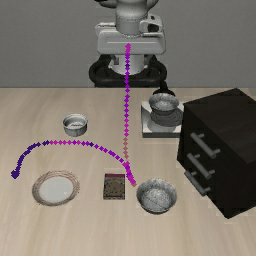

In [156]:
images = [step["observation"]["image"] for step in episode["steps"]]
images = [img.numpy() for img in images]
for i, image in enumerate(images):
    image = draw_traj(image, np.array(traj_depth_points))

image_plt = [Image.fromarray(image) for image in images]
display.Image(as_gif(images=image_plt, path=f'depth_trajectory_{episode_id}.gif'))

### add griiper states

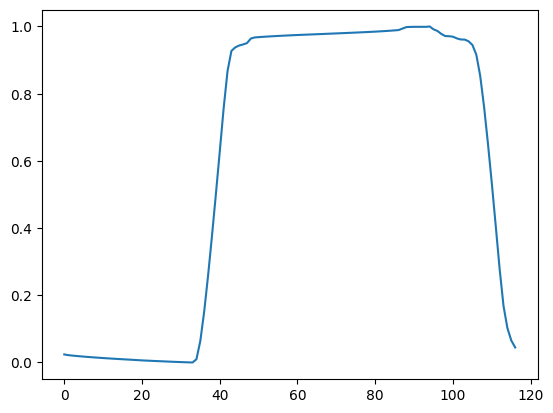

In [74]:
states = np.array(states)

def norm(arr):
    arr_min = np.min(arr)
    arr_max = np.max(arr)
    # 归一化到 [0, 1]
    normalized_arr = (arr - arr_min) / (arr_max - arr_min)
    return normalized_arr

gripper_norm_states = norm(states[:,-1])
plt.plot(gripper_norm_states)

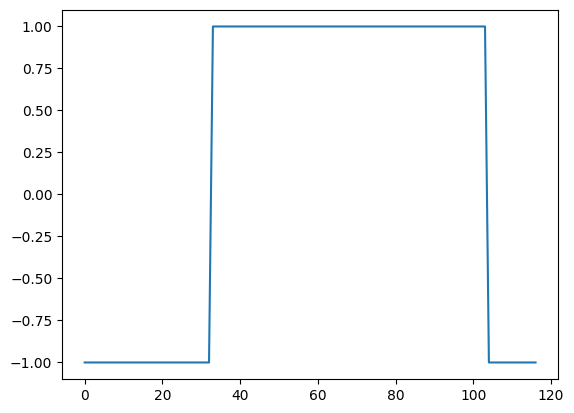

In [67]:
actions = np.array(actions)
plt.plot(actions[:,-1])